In [1]:
#Setup the google drive
import os
#from google.colab import drive
#drive.mount('/content/gdrive')
#os.listdir('/content/gdrive/MyDrive')
#Basic packages
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
tf.random.set_seed(2)
#Keras/TensorFlow
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, Input, Add, Concatenate, Dense
from tensorflow.keras.models import Sequential, load_model, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
#Keras image processing
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
#Seaborn
import seaborn as sns #

2024-12-11 11:02:24.132774: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-12-11 11:02:28.066367: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-12-11 11:02:30.935805: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-11 11:02:34.402673: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-11 11:02:35.205330: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-11 11:02:40.240829: I tensorflow/core/platform/cpu_feature_gu

In [2]:
# can replace wit full trainPath and TestPath
curPath = os.getcwd()
trainPath = curPath + '/NEW_TRAIN'
testPath = curPath + '/NEW_TEST'


trainIDs = next(os.walk(trainPath))[1]  # IDs, refers to 6-digit identifier (ie 000000)
train_x = []
train_y = []

for id in trainIDs:
    imPath = trainPath + '/' + id
    imNames = next(os.walk(imPath))[2]  # this will break if there are not at least 3 images in each subdir
    train_x.append([tf.keras.utils.load_img(imPath + '/' + imNames[0],target_size=(256,256)), \
                    tf.keras.utils.load_img(imPath + '/' + imNames[1],target_size=(256,256))])
    train_y.append(tf.keras.utils.load_img(imPath + '/' + imNames[2],target_size=(256,256)))

train_x = np.array(train_x)
train_y = np.array(train_y)

In [3]:
curPath = os.getcwd()
#testPath = curPath + '/NEW_TEST'

testIDs = next(os.walk(testPath))[1]  # IDs, refers to 6-digit identifier (ie 000000)
test_x = []
test_y = []

for id in testIDs:
    imPath = testPath + '/' + id
    imNames = next(os.walk(imPath))[2]  # this will break if there are not at least 3 images in each subdir
    test_x.append([tf.keras.utils.load_img(imPath + '/' + imNames[0],target_size=(256,256)), \
                    tf.keras.utils.load_img(imPath + '/' + imNames[1],target_size=(256,256))])
    test_y.append(tf.keras.utils.load_img(imPath + '/' + imNames[2],target_size=(256,256)))

test_x = np.array(test_x)
test_y = np.array(test_y)

0


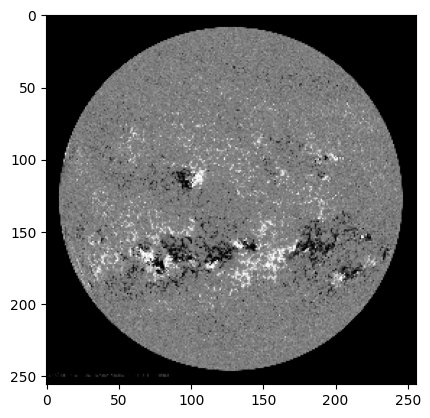

In [4]:
plt.imshow(train_x[0,1])
print(train_y[0,1][0,0])

In [7]:
model_best = load_model('best_model_no_dense.keras')
#best_eval = model_best.evaluate([test_x[:,0,:,:,0], test_x[:,1,:,:,0]],test_y[:,:,:,0],verbose=2)
best_eval = model_best.evaluate([test_x[:,0,:,:,0], test_x[:,1,:,:,0]],test_y[:,:,:,0],verbose=2)
#new_images = model_best.predict([test_x[:,0,:,:,0], test_x[:,1,:,:,0]])
new_images = model_best.predict([test_x[:,0,:,:,0], test_x[:,1,:,:,0]])

14/14 - 4s - 266ms/step - loss: 11.6549
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step


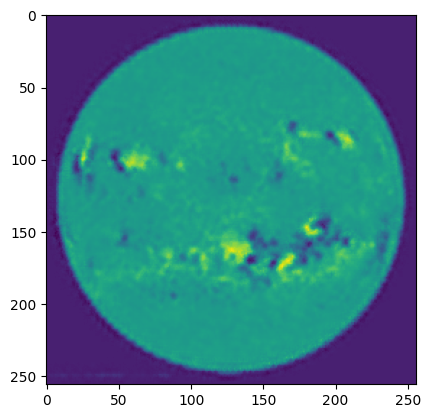

In [8]:
plt.imshow(new_images[0])

In [9]:
diff = []
image_mean = []
image_std = []
print(np.shape(new_images))
for i in range(428):
  diff.append(np.subtract((new_images[i,:,:,0]),(test_y[i,:,:,0])))
  image_mean.append(np.mean(diff[i]))
  image_std.append(np.std(diff[i]))

total_mean = np.mean(image_mean)
total_std = np.std(image_std)
print("The mean of the pixel differences is ", total_mean, " +/- ", total_std)

(428, 256, 256, 1)
The mean of the pixel differences is  -0.17939791  +/-  0.31520194


-2.3403702


Text(0, 0.5, 'Pixel Difference')

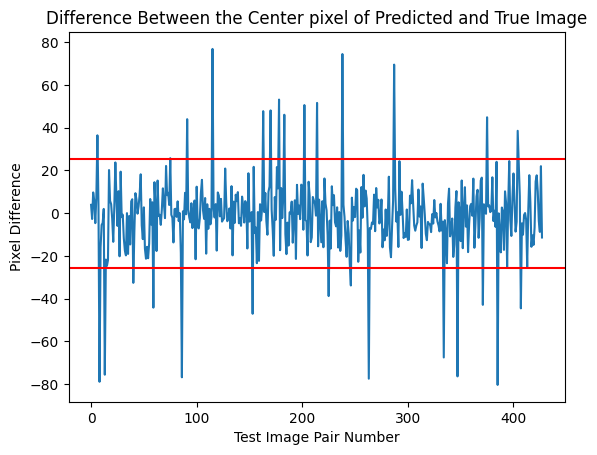

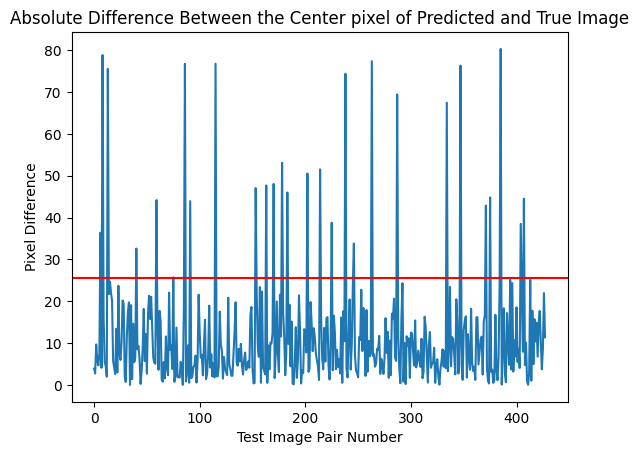

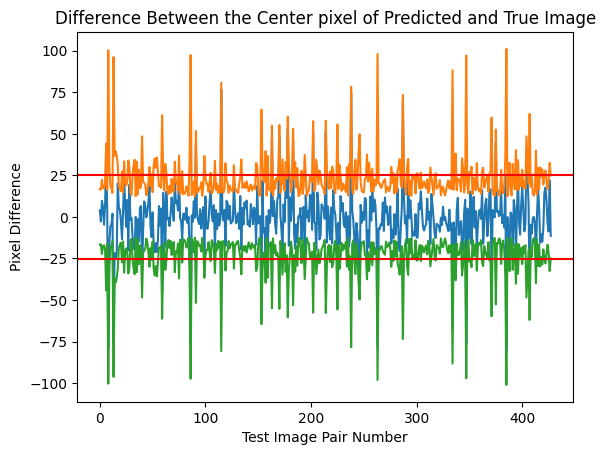

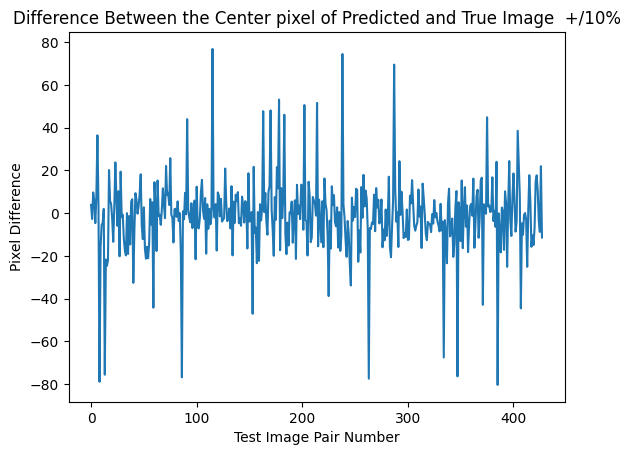

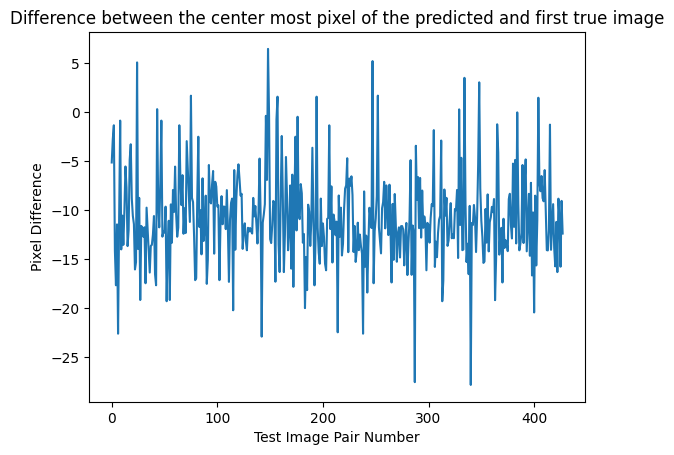

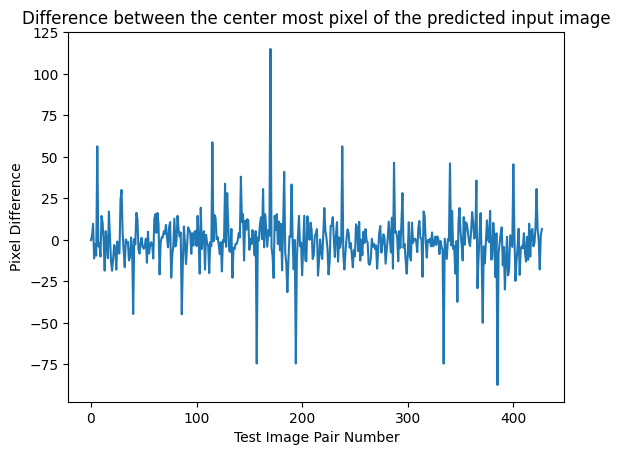

In [10]:
diff512 = []
diff1 = []
diffin = []
middle = []
middle10 = []
diff512plus = []
diff512minus = []
for i in range(428):
  diff512.append(np.subtract((new_images[i,126,126,0]),(test_y[i,126,126,0])))
  diff1.append(np.subtract((new_images[i,126,126,0]),(test_y[1,126,126,0])))
  diffin.append(np.subtract((new_images[i,126,126,0]),(test_x[i,1,126,126,0])))
  middle.append(test_y[i,126,126,0])
  middle10.append(0.1*test_y[i,126,126,0])
  diff512plus.append(np.abs(np.subtract((new_images[i,126,126,0]),(test_y[i,126,126,0]))) +0.1*test_y[i,126,126,0])
  diff512minus.append(-np.abs(np.subtract((new_images[i,126,126,0]),(test_y[i,126,126,0]))) -0.1*test_y[i,126,126,0])

plt.figure()
plt.plot(diff512)
plt.axhline(y=25.5, color = 'r')
plt.axhline(y=-25.5, color = 'r')
plt.title('Difference Between the Center pixel of Predicted and True Image')
plt.xlabel('Test Image Pair Number')
plt.ylabel('Pixel Difference')

plt.figure()
plt.plot(np.abs(diff512))
plt.axhline(y=25.5, color = 'r')
plt.title('Absolute Difference Between the Center pixel of Predicted and True Image')
plt.xlabel('Test Image Pair Number')
plt.ylabel('Pixel Difference')
print(diff512[126])

plt.figure()
plt.plot(diff512)
plt.plot(diff512plus)
plt.plot(diff512minus)
plt.axhline(y=25.5, color = 'r')
plt.axhline(y=-25.5, color = 'r')
plt.title('Difference Between the Center pixel of Predicted and True Image')
plt.xlabel('Test Image Pair Number')
plt.ylabel('Pixel Difference')

plt.figure()
plt.plot(diff512)

plt.title('Difference Between the Center pixel of Predicted and True Image  +/10%')
plt.xlabel('Test Image Pair Number')
plt.ylabel('Pixel Difference')


plt.figure()
plt.plot(diff1)
plt.title('Difference between the center most pixel of the predicted and first true image')
plt.xlabel('Test Image Pair Number')
plt.ylabel('Pixel Difference')

plt.figure()
plt.plot(diffin)
plt.title('Difference between the center most pixel of the predicted input image')
plt.xlabel('Test Image Pair Number')
plt.ylabel('Pixel Difference')

(428, 256, 256)


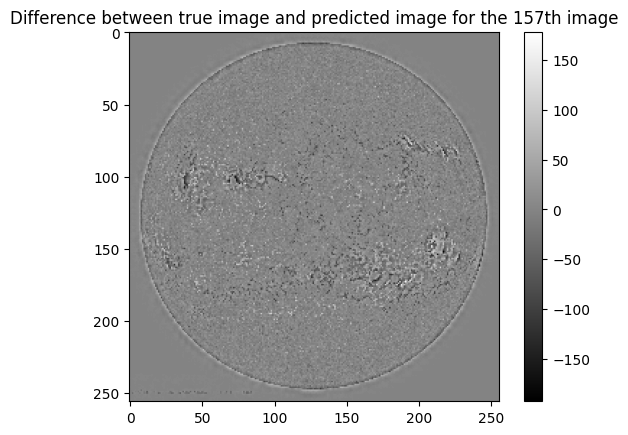

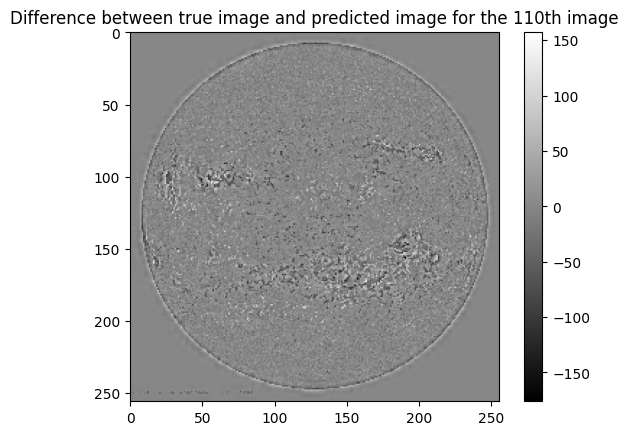

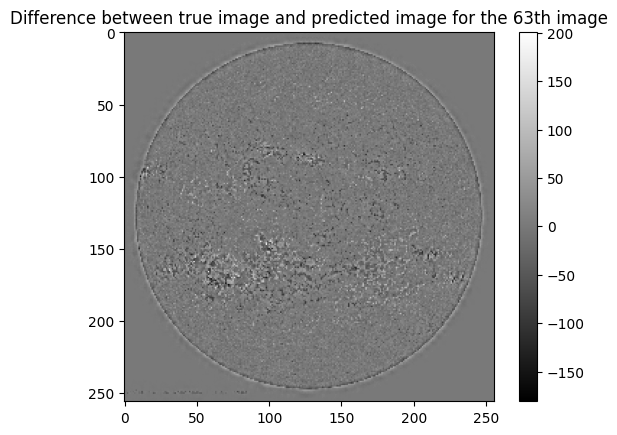

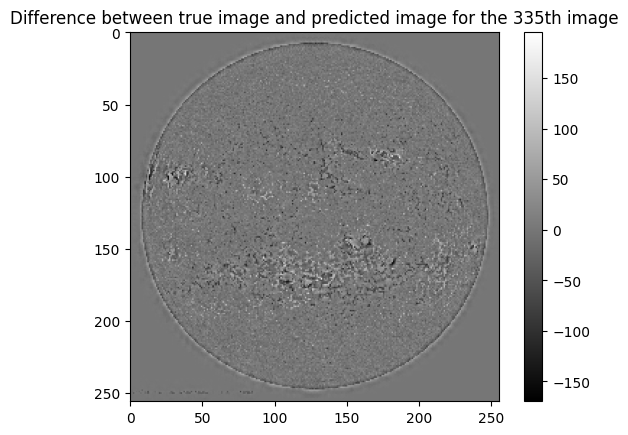

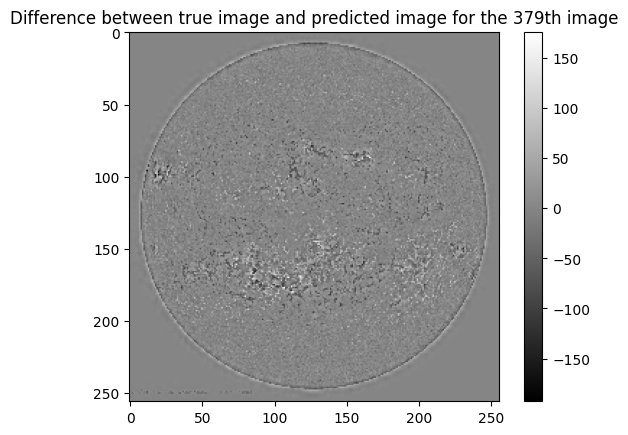

In [11]:
n = 5
print(np.shape(diff))
for i in range(n):
        i = np.random.randint(0,428) # choose a random number between 0 and len(diff)
        plt.figure()
        plt.imshow(diff[i], cmap='gray')
        plt.title('Difference between true image and predicted image for the ' + str(i) + 'th image')
        plt.colorbar()

        plt.show()

In [ ]:
#Long Term Predictions
#In order for this section to work, the model needs to be retrained with only 1 input image, not 2
#ie. change the line x = Add()([x1,x2]) to x = x1
# and in the .fit change  [train_x[:,0,:,:,0], train_x[:,1,:,:,0]] to just train_x[:,0,:,:,0] or train_x[:,1,:,:,0]
image_path = curPath + '/LONG/'
image_start1 = tf.keras.utils.load_img(image_path + '20241118_001500_1024_HMIB.jpg',target_size=(256,256))
image_start = np.array(image_start1).reshape([1,256,256,3])
PICK = 1

if PICK == 1:
    image_final = tf.keras.utils.load_img(image_path + '20241118_011500_1024_HMIB.jpg',target_size=(256,256))
    ts = 4
elif PICK == 2:
    image_final = tf.keras.utils.load_img(image_path + '20241118_021500_1024_HMIB.jpg',target_size=(256,256))
    ts = 8
elif PICK ==3:
    image_final = tf.keras.utils.load_img(image_path + '20241118_121500_1024_HMIB.jpg',target_size=(256,256))
    ts = 47
elif PICK == 4:
    image_final = tf.keras.utils.load_img(image_path + '20241118_234500_1024_HMIB.jpg',target_size=(256,256))
    ts = 93

size = 256 #1024

image_final = np.array(image_final)
new_image = model_best.predict(image_start[:,:,:,1])
for i in range(ts):
    if np.shape(new_image) != [1,size,size,1]:
        new_image = new_image.reshape([1,size,size])
    next_image = model_best.predict(new_image)
    new_image = next_image

plt.figure()
plt.imshow(image_start1,cmap='grey')
plt.title('First Image')
plt.colorbar()
plt.show()

plt.figure()
plt.imshow(image_final,cmap='grey')
plt.title('True Image')
plt.colorbar()
plt.show()

if np.shape(new_image) != [1,size,size,1]:
    new_image = new_image.reshape([size,size,1])

plt.figure()
plt.imshow(new_image,cmap='grey')
plt.title('Predicted Image, Long Jump')
plt.colorbar()
plt.show()
plt.savefig('Tuesday_1_Predicted_image_8ts.png')

diff = np.subtract(new_image,image_final[:,:,1].reshape([size,size,1]))
plt.figure()
plt.imshow(diff,cmap='grey')
plt.title('Difference between True and Predicted Image, Long Jump')
plt.colorbar()
plt.show()

diff = np.subtract(image_start1,image_final[:,:,1].reshape([size,size,1]))
plt.figure()
plt.imshow(diff,cmap='grey')
plt.title('Difference between First and Last True Images')
plt.colorbar()
plt.show()

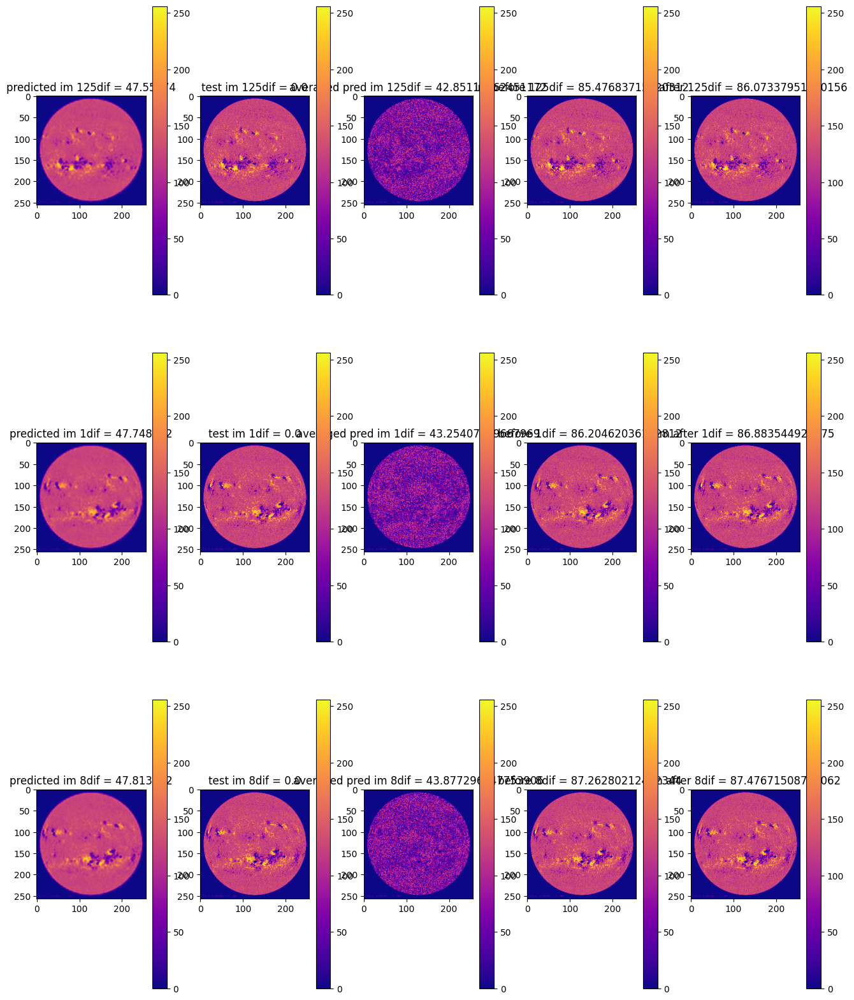

In [13]:
fig, ax = plt.subplots(3, 5, figsize=(16,20))
for i in range(3):
    x = np.random.randint(0,143)

    dif = np.mean(np.abs(test_y[x,:,:,0] - new_images[x]))
    im = ax[i,0].imshow(new_images[x], cmap='plasma', vmin=0, vmax=256)
    ax[i,0].set_title('predicted im ' + str(x) + "dif = " + str(dif))
    fig.colorbar(im)

    dif = np.mean(np.abs(test_y[x,:,:,0] - test_y[x,:,:,0]))
    im = ax[i,1].imshow(test_y[x,:,:,0], cmap='plasma', vmin=0, vmax=256)
    ax[i,1].set_title('test im ' + str(x) + "dif = " + str(dif))
    fig.colorbar(im)

    dif = np.mean(np.abs(test_y[x,:,:,0] - (test_x[x,0,:,:,0]+test_x[x,1,:,:,0])/2))
    im = ax[i,2].imshow((test_x[x,0,:,:,0]+test_x[x,1,:,:,0])/2, cmap='plasma', vmin=0, vmax=256)
    ax[i,2].set_title('averaged pred im ' + str(x) + "dif = " + str(dif))
    fig.colorbar(im)

    dif = np.mean(np.abs(test_y[x,:,:,0] - test_x[x,0,:,:,0]))
    im = ax[i,3].imshow(test_x[x,0,:,:,0], cmap='plasma', vmin=0, vmax=256)
    ax[i,3].set_title('im before ' + str(x) + "dif = " + str(dif))
    fig.colorbar(im)

    dif = np.mean(np.abs(test_y[x,:,:,0] - test_x[x,1,:,:,0]))
    im = ax[i,4].imshow(test_x[x,0,:,:,0], cmap='plasma', vmin=0, vmax=256)
    ax[i,4].set_title('im after ' + str(x) + "dif = " + str(dif))
    fig.colorbar(im)

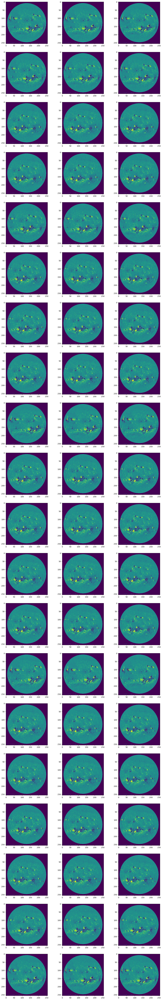

In [14]:
fig, ax = plt.subplots(20,3, figsize=(16,100))
for i in range(120,141):
    ax[120-i,0].imshow(test_x[i,0,:,:,0])
    ax[120-i,1].imshow(test_y[i,:,:,0])
    ax[120-i,2].imshow(test_x[i,0,:,:,0])

In [15]:
testy = np.abs(test_x[0,1,:,:,0] - test_y[0,:,:,0])/2
print(np.mean(testy))
testy = np.abs(new_images[0] - test_y[0,:,:,0])
print(np.mean(testy))

43.373504638671875
47.70052


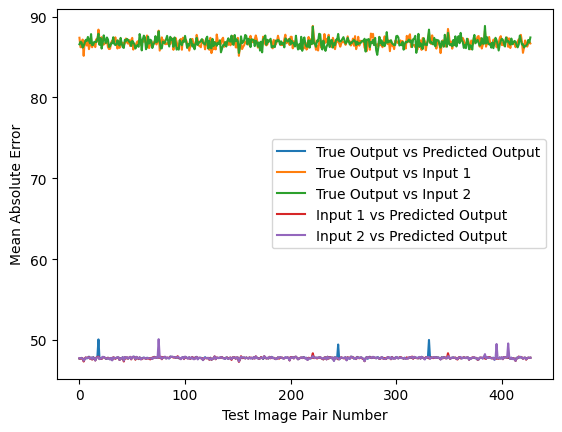

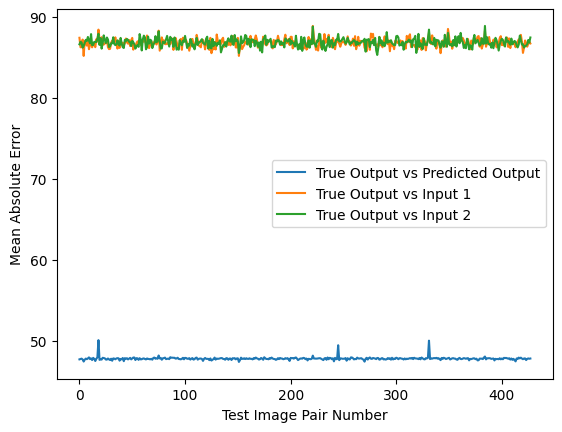

In [16]:
predict = []
im1 = []
im2 = []
newim1 = []
newim2 = []
for x in range(428):
    dif = np.mean(np.abs(test_y[x,:,:,0] - new_images[x]))
    predict.append(dif)

    dif = np.mean(np.abs(test_y[x,:,:,0] - test_x[x,0,:,:,0]))
    im1.append(dif)

    dif = np.mean(np.abs(test_y[x,:,:,0] - test_x[x,1,:,:,0]))
    im2.append(dif)

    dif = np.mean(np.abs(test_x[x,0,:,:,0] - new_images[x]))
    newim1.append(dif)

    dif = np.mean(np.abs(test_x[x,1,:,:,0] - new_images[x]))
    newim2.append(dif)

plt.figure()
plt.plot(predict)
plt.plot(im1)
plt.plot(im2)
plt.plot(newim1)
plt.plot(newim2)
plt.xlabel('Test Image Pair Number')
plt.ylabel('Mean Absolute Error')
plt.legend(['True Output vs Predicted Output','True Output vs Input 1','True Output vs Input 2', 'Input 1 vs Predicted Output','Input 2 vs Predicted Output'])
plt.savefig('MAE_TEST_COMPARE_ALL.png')

plt.figure()
plt.plot(predict)
plt.plot(im1)
plt.plot(im2)
plt.xlabel('Test Image Pair Number')
plt.ylabel('Mean Absolute Error')
plt.legend(['True Output vs Predicted Output','True Output vs Input 1','True Output vs Input 2'])
plt.savefig('MAE_TEST_COMPARE.png')



47.754765


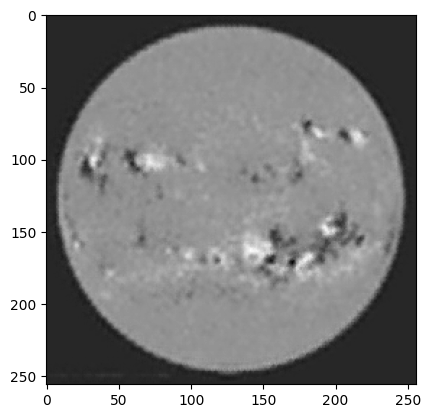

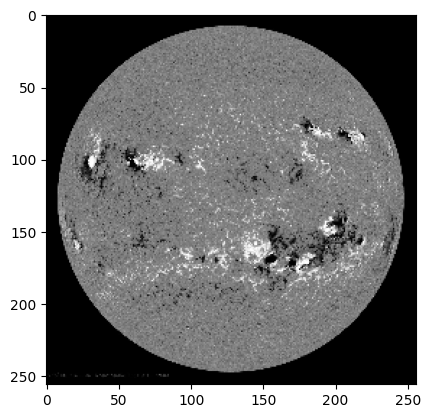

In [17]:
print(np.mean(np.abs(test_y[178,:,:,0] - new_images[178])))
plt.imshow(new_images[178],cmap='grey')
plt.savefig('178test.png')
plt.figure()
plt.imshow(test_y[178,:,:,0],cmap='grey')